In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os

from tslearn.clustering import TimeSeriesKMeans
from tslearn.barycenters import dtw_barycenter_averaging

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE, MDS
from sklearn.cluster import AgglomerativeClustering

from scipy.cluster.hierarchy import dendrogram
from tqdm.autonotebook import tqdm

warnings.filterwarnings("ignore")
sns.set_style("darkgrid")

SEED=23

C:\Users\user\AppData\Local\Temp\ipykernel_49900\1607567806.py:17: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


### <a>1. 데이터 확인하기</a>

In [4]:
# Data Reading 
data = pd.read_csv('../datasets/close_2011.csv') #날짜를 인덱스로
data['날짜'] = pd.to_datetime(data['날짜']) #날짜형식으로 변환
data

,날짜,1460,1040,79160,11150,97950,139130,69730,17940,7700,...,14190,50090,115160,28080,66060,65510,84110,24060,10240,37440
0,2011-06-30,153000,68554,26895,2435,235500,15619,4240,52700,4895,...,4670,1595,8423,5930,709,6030,3588,1760,2520,7990
1,2011-07-01,153500,68648,26124,2480,224500,15571,4240,52800,4935,...,5052,1530,8644,6030,735,5930,3694,1760,2665,8130
2,2011-07-04,153000,68271,25217,2470,216500,15860,4250,52800,4915,...,4772,1585,8976,6050,800,6030,3788,1735,2655,8250
3,2011-07-05,153000,69497,25081,2490,229500,15860,4170,54000,4910,...,4670,1580,8958,6030,806,6200,3717,1820,2835,8030
4,2011-07-06,152000,69968,24899,2550,231000,15908,4170,54000,4890,...,4567,1550,8893,6040,801,6110,3788,1705,2865,8200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,2012-06-25,168000,76097,24491,2375,345000,12678,3350,48000,3055,...,7751,1485,8792,8080,631,10600,6790,1665,2250,6050
246,2012-06-26,168500,75909,24627,2345,343500,12775,3360,47850,3065,...,7658,1525,9733,9290,628,10550,7163,1645,2180,6090
247,2012-06-27,168000,74683,24083,2360,328000,13016,3340,48000,3075,...,7425,1500,9041,10450,639,11250,7194,1655,2068,6120
248,2012-06-28,168000,74117,23947,2350,325000,13064,3290,48000,3120,...,7733,1495,8709,10050,633,11050,7132,1680,2113,6130


In [5]:
data.columns # datetime 변경 확인

Index(['날짜', '1460', '1040', '79160', '11150', '97950', '139130', '69730',
       '17940', '7700',
       ...
       '14190', '50090', '115160', '28080', '66060', '65510', '84110', '24060',
       '10240', '37440'],
      dtype='object', length=1470)

In [6]:
data.isna().sum() #결측치 확인

날짜       0
1460     0
1040     0
79160    0
11150    0
        ..
65510    0
84110    0
24060    0
10240    0
37440    0
Length: 1470, dtype: int64

In [7]:
data = data.dropna(axis=1) #결측치가 있는 행 삭제 
data

,날짜,1460,1040,79160,11150,97950,139130,69730,17940,7700,...,14190,50090,115160,28080,66060,65510,84110,24060,10240,37440
0,2011-06-30,153000,68554,26895,2435,235500,15619,4240,52700,4895,...,4670,1595,8423,5930,709,6030,3588,1760,2520,7990
1,2011-07-01,153500,68648,26124,2480,224500,15571,4240,52800,4935,...,5052,1530,8644,6030,735,5930,3694,1760,2665,8130
2,2011-07-04,153000,68271,25217,2470,216500,15860,4250,52800,4915,...,4772,1585,8976,6050,800,6030,3788,1735,2655,8250
3,2011-07-05,153000,69497,25081,2490,229500,15860,4170,54000,4910,...,4670,1580,8958,6030,806,6200,3717,1820,2835,8030
4,2011-07-06,152000,69968,24899,2550,231000,15908,4170,54000,4890,...,4567,1550,8893,6040,801,6110,3788,1705,2865,8200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,2012-06-25,168000,76097,24491,2375,345000,12678,3350,48000,3055,...,7751,1485,8792,8080,631,10600,6790,1665,2250,6050
246,2012-06-26,168500,75909,24627,2345,343500,12775,3360,47850,3065,...,7658,1525,9733,9290,628,10550,7163,1645,2180,6090
247,2012-06-27,168000,74683,24083,2360,328000,13016,3340,48000,3075,...,7425,1500,9041,10450,639,11250,7194,1655,2068,6120
248,2012-06-28,168000,74117,23947,2350,325000,13064,3290,48000,3120,...,7733,1495,8709,10050,633,11050,7132,1680,2113,6130


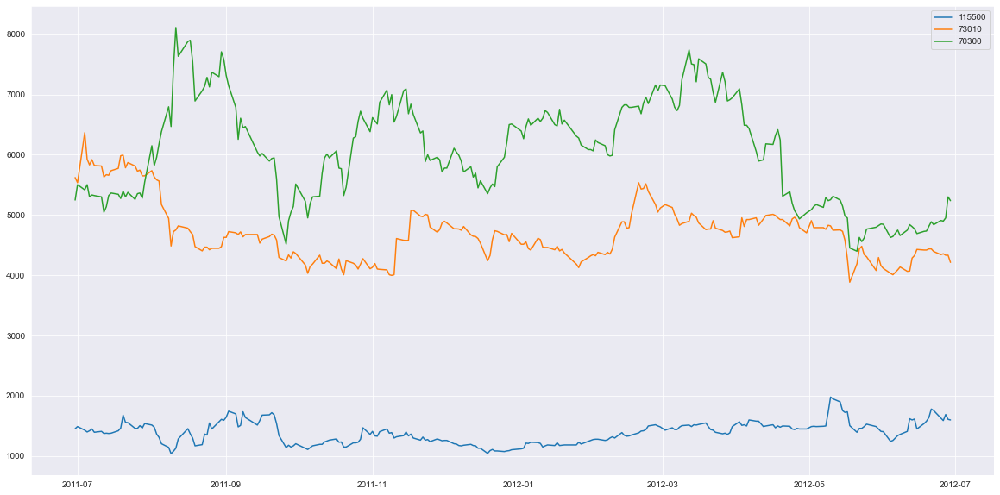

In [8]:
# 3개의 서로 다른 stores를 랜덤으로 확인해보자.
rand_code = np.random.choice(data.columns, 3)

x = data['날짜']

y = data[rand_code[0]]
y_2 = data[rand_code[1]]
y_3 = data[rand_code[2]]

plt.figure(figsize=(20,10))
plt.grid(True)
plt.plot(x, y, label=rand_code[0])
plt.plot(x, y_2, label=rand_code[1])
plt.plot(x, y_3, label=rand_code[2])

plt.legend()
plt.show()

#### <a>무상감자는 수정종가에 반영되지 않았다. 나중에 해결해보자. -> 해결완료</a>

In [9]:
data =data.set_index('날짜')

In [10]:
# # .loc:인덱스 기준으로 행 데이터 읽기
# # .iloc:행 번호를 기준으로 행 데이터 읽기
# # .pct_change().iloc[1:]
df = data.T
df

날짜,2011-06-30,2011-07-01,2011-07-04,2011-07-05,2011-07-06,2011-07-07,2011-07-08,2011-07-11,2011-07-12,2011-07-13,...,2012-06-18,2012-06-19,2012-06-20,2012-06-21,2012-06-22,2012-06-25,2012-06-26,2012-06-27,2012-06-28,2012-06-29
1460,153000,153500,153000,153000,152000,151500,151000,151000,150000,151000,...,167000,167000,167500,166500,166500,168000,168500,168000,168000,167500
1040,68554,68648,68271,69497,69968,70062,68648,69119,68176,68176,...,74871,74589,74683,76475,76852,76097,75909,74683,74117,75343
79160,26895,26124,25217,25081,24899,25171,25580,25625,25398,25806,...,23267,23131,23539,23629,24219,24491,24627,24083,23947,23539
11150,2435,2480,2470,2490,2550,2780,2750,2875,2755,2810,...,2390,2370,2370,2385,2365,2375,2345,2360,2350,2410
97950,235500,224500,216500,229500,231000,240000,242000,242000,241000,245000,...,340000,351000,343500,352000,348500,345000,343500,328000,325000,325500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65510,6030,5930,6030,6200,6110,5970,6050,6250,5900,6100,...,9630,9830,9900,10050,10050,10600,10550,11250,11050,10550
84110,3588,3694,3788,3717,3788,3918,3993,4590,4746,4652,...,6290,6290,6216,6633,7006,6790,7163,7194,7132,7132
24060,1760,1760,1735,1820,1705,1685,1720,1765,1670,1730,...,1700,1675,1680,1685,1665,1665,1645,1655,1680,1685
10240,2520,2665,2655,2835,2865,2835,2850,2805,2740,2715,...,2480,2450,2420,2373,2313,2250,2180,2068,2113,2090


### <a>2. 데이터 스케일링</a>

In [11]:
from sklearn.preprocessing import StandardScaler

In [12]:
scaler = StandardScaler()
scaled_ts = scaler.fit_transform(df.T).T
df_norm = pd.DataFrame(scaled_ts, columns=df.columns)
final_df = df_norm.set_index(df.index).T
final_df

,1460,1040,79160,11150,97950,139130,69730,17940,7700,114090,...,14190,50090,115160,28080,66060,65510,84110,24060,10240,37440
날짜,,,,,,,,,,,,,,,,,,,,,
2011-06-30,-0.823251,-1.908806,1.905869,-1.058906,-2.663269,1.404575,1.252148,-0.137547,2.881363,-0.288798,...,-2.563087,-0.073962,-0.640729,-0.716443,0.092495,-1.994344,-1.405919,0.930717,0.158247,3.743682
2011-07-01,-0.782269,-1.882585,1.400723,-0.911854,-3.047066,1.365750,1.252148,-0.111467,2.967560,0.146139,...,-2.335612,-0.393614,-0.508493,-0.607875,0.287695,-2.052993,-1.332343,0.930717,0.623640,4.105850
2011-07-04,-0.823251,-1.987748,0.806474,-0.944532,-3.326191,1.599509,1.276145,-0.111467,2.924461,0.146139,...,-2.502347,-0.123140,-0.309838,-0.586161,0.775695,-1.994344,-1.267097,0.752692,0.591544,4.416280
2011-07-05,-0.823251,-1.645759,0.717369,-0.879176,-2.872613,1.599509,1.084171,0.201496,2.913687,0.146139,...,-2.563087,-0.147728,-0.320609,-0.607875,0.820741,-1.894639,-1.316379,1.357978,1.169274,3.847158
2011-07-06,-0.905215,-1.514375,0.598126,-0.683106,-2.820277,1.638334,1.084171,0.201496,2.870589,0.401984,...,-2.624422,-0.295260,-0.359502,-0.597018,0.783203,-1.947424,-1.267097,0.539061,1.265562,4.286934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-06-25,0.406216,0.195291,0.330812,-1.254976,1.157251,-0.974265,-0.883559,-1.363318,-1.083657,0.299646,...,-0.728402,-0.614911,-0.419936,1.617778,-0.493105,0.685942,0.816629,0.254220,-0.708348,-1.274936
2012-06-26,0.447198,0.142849,0.419916,-1.353011,1.104916,-0.895806,-0.859562,-1.402439,-1.062108,0.683414,...,-0.783782,-0.418202,0.143117,2.931457,-0.515628,0.656617,1.075533,0.111800,-0.933021,-1.171459
2012-06-27,0.406216,-0.199140,0.063498,-1.303993,0.564111,-0.700872,-0.907555,-1.363318,-1.040559,1.092766,...,-0.922530,-0.541145,-0.270945,4.190851,-0.433044,1.067164,1.097050,0.183010,-1.292497,-1.093852


### <a>3. 윈저라이징</a>

In [13]:
df = final_df
df

,1460,1040,79160,11150,97950,139130,69730,17940,7700,114090,...,14190,50090,115160,28080,66060,65510,84110,24060,10240,37440
날짜,,,,,,,,,,,,,,,,,,,,,
2011-06-30,-0.823251,-1.908806,1.905869,-1.058906,-2.663269,1.404575,1.252148,-0.137547,2.881363,-0.288798,...,-2.563087,-0.073962,-0.640729,-0.716443,0.092495,-1.994344,-1.405919,0.930717,0.158247,3.743682
2011-07-01,-0.782269,-1.882585,1.400723,-0.911854,-3.047066,1.365750,1.252148,-0.111467,2.967560,0.146139,...,-2.335612,-0.393614,-0.508493,-0.607875,0.287695,-2.052993,-1.332343,0.930717,0.623640,4.105850
2011-07-04,-0.823251,-1.987748,0.806474,-0.944532,-3.326191,1.599509,1.276145,-0.111467,2.924461,0.146139,...,-2.502347,-0.123140,-0.309838,-0.586161,0.775695,-1.994344,-1.267097,0.752692,0.591544,4.416280
2011-07-05,-0.823251,-1.645759,0.717369,-0.879176,-2.872613,1.599509,1.084171,0.201496,2.913687,0.146139,...,-2.563087,-0.147728,-0.320609,-0.607875,0.820741,-1.894639,-1.316379,1.357978,1.169274,3.847158
2011-07-06,-0.905215,-1.514375,0.598126,-0.683106,-2.820277,1.638334,1.084171,0.201496,2.870589,0.401984,...,-2.624422,-0.295260,-0.359502,-0.597018,0.783203,-1.947424,-1.267097,0.539061,1.265562,4.286934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-06-25,0.406216,0.195291,0.330812,-1.254976,1.157251,-0.974265,-0.883559,-1.363318,-1.083657,0.299646,...,-0.728402,-0.614911,-0.419936,1.617778,-0.493105,0.685942,0.816629,0.254220,-0.708348,-1.274936
2012-06-26,0.447198,0.142849,0.419916,-1.353011,1.104916,-0.895806,-0.859562,-1.402439,-1.062108,0.683414,...,-0.783782,-0.418202,0.143117,2.931457,-0.515628,0.656617,1.075533,0.111800,-0.933021,-1.171459
2012-06-27,0.406216,-0.199140,0.063498,-1.303993,0.564111,-0.700872,-0.907555,-1.363318,-1.040559,1.092766,...,-0.922530,-0.541145,-0.270945,4.190851,-0.433044,1.067164,1.097050,0.183010,-1.292497,-1.093852


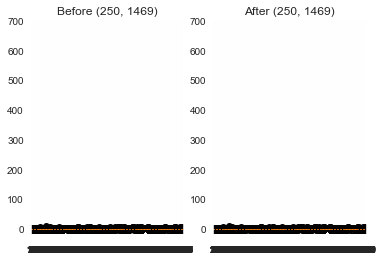

In [14]:
# 3사분위 - 1사분위를 IQR범위로 지정한 다음,
# IRQ * 1.5를 경계 값으로 잡음
IQR = df.quantile(0.75)-df.quantile(0.25)

line_down = df.quantile(0.25)-IQR*1.5
line_up = df.quantile(0.75)+IQR*1.5

# winsorized된 값 확인
winsorized = df.clip(line_down,line_up, axis= 1)

# boxplot그리기
fig,ax = plt.subplots(1,2)
ax[0].boxplot(df)
ax[0].set_title(f"Before {df.shape}")
ax[0].set_ylim(-30,700)

ax[1].boxplot(df)
ax[1].set_title(f"After {df.shape}")
ax[1].set_ylim(-30,700)

plt.show()


In [35]:
winsorized 

,1460,1040,79160,11150,97950,139130,69730,17940,7700,114090,...,14190,50090,115160,28080,66060,65510,84110,24060,10240,37440
날짜,,,,,,,,,,,,,,,,,,,,,
2011-06-30,-0.823251,-1.908806,1.463048,-1.058906,-2.501900,1.404575,1.252148,-0.137547,2.042298,-0.288798,...,-2.559737,-0.073962,-0.640729,-0.716443,0.092495,-1.994344,-1.405919,0.930717,0.158247,2.123625
2011-07-01,-0.782269,-1.882585,1.400723,-0.911854,-2.501900,1.365750,1.252148,-0.111467,2.042298,0.146139,...,-2.335612,-0.393614,-0.508493,-0.607875,0.287695,-2.052993,-1.332343,0.930717,0.623640,2.123625
2011-07-04,-0.823251,-1.987748,0.806474,-0.944532,-2.501900,1.599509,1.276145,-0.111467,2.042298,0.146139,...,-2.502347,-0.123140,-0.309838,-0.586161,0.775695,-1.994344,-1.267097,0.752692,0.591544,2.123625
2011-07-05,-0.823251,-1.645759,0.717369,-0.879176,-2.501900,1.599509,1.084171,0.201496,2.042298,0.146139,...,-2.559737,-0.147728,-0.320609,-0.607875,0.820741,-1.894639,-1.316379,1.357978,1.169274,2.123625
2011-07-06,-0.905215,-1.514375,0.598126,-0.683106,-2.501900,1.638334,1.084171,0.201496,2.042298,0.401984,...,-2.559737,-0.295260,-0.359502,-0.597018,0.783203,-1.947424,-1.267097,0.539061,1.265562,2.123625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-06-25,0.406216,0.195291,0.330812,-1.254976,1.157251,-0.974265,-0.883559,-1.363318,-1.083657,0.299646,...,-0.728402,-0.614911,-0.419936,1.617778,-0.493105,0.685942,0.816629,0.254220,-0.708348,-1.274936
2012-06-26,0.447198,0.142849,0.419916,-1.353011,1.104916,-0.895806,-0.859562,-1.402439,-1.062108,0.683414,...,-0.783782,-0.418202,0.143117,2.316688,-0.515628,0.656617,1.075533,0.111800,-0.933021,-1.171459
2012-06-27,0.406216,-0.199140,0.063498,-1.303993,0.564111,-0.700872,-0.907555,-1.363318,-1.040559,1.092766,...,-0.922530,-0.541145,-0.270945,2.316688,-0.433044,1.067164,1.097050,0.183010,-1.292497,-1.093852


Text(0.5, 1.0, '34120')

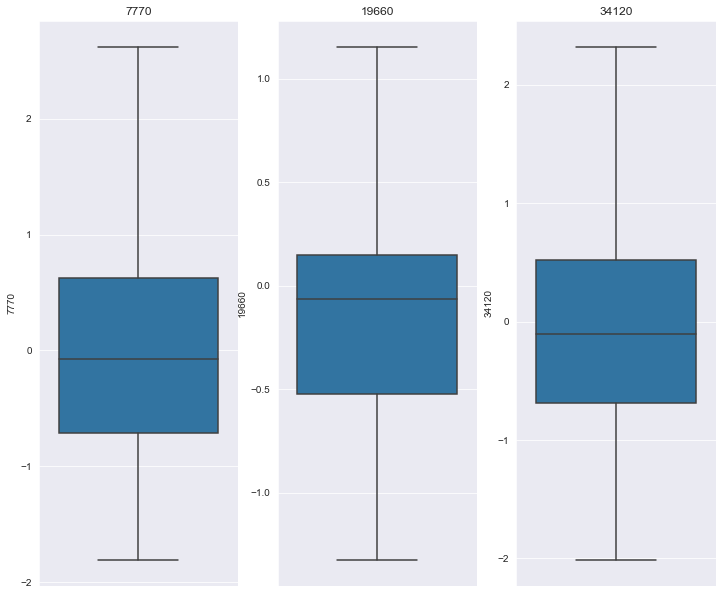

In [48]:
# 3개의 서로 다른 stores를 랜덤으로 확인해보자.
# 혹시 몰라서 Boxplot으로 이상치 확인해 봤는데, 이상치 없음
rand_code = np.random.choice(winsorized.columns, 3)

fig , axes = plt.subplots(nrows=1 ,ncols=3,
                          figsize=(10,8) )
plt.subplots_adjust(left=0.05, bottom=0.01, right=0.99, 
                    top=0.99, wspace=None, hspace=0.2)
ax = axes.flatten()

sns.boxplot(y=winsorized[rand_code[0]], data=winsorized, ax = ax[0])
ax[0].set_title(rand_code[0])
sns.boxplot(y=winsorized[rand_code[1]], data=winsorized, ax = ax[1])
ax[1].set_title(rand_code[1])
sns.boxplot(y=winsorized[rand_code[2]], data=winsorized, ax = ax[2])
ax[2].set_title(rand_code[2])

In [49]:
# winsorized된 데이터를 dataframe으로 바꾼 건 df형태
df = winsorized

In [50]:
# winsorized된 데이터를 nupy형태로 바꾼 건 scaled_ts 형태
scaled_ts = winsorized.to_numpy()

### <a>4. 시계열 데이터  K-means</a>

In [25]:
# KMeans 실행 및 결과 플롯
# max_cluster: 
# 성과 시각화
def get_kmeans_results(df, max_clusters=10, metric='euclidean', seed=23):
    """
    매개변수 설명: 
    Runs KMeans n times (according to max_cluster range)

(df1: pd(df1Frame or np.array
        Time Series(df1
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns: 
    -------
    None      
    """
    # Main metrics
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1) # 1~10까지

    # tqdm: 내가 수행하는 작업이 의도 대로 돌아가고 있는지 진행상황을 확인할 필요가 있음. 
    # K-means학습(fit) 점을 10번 찍겠다. 
    for K in tqdm(clusters_range): # 클러스터를 5개~20개 둔 것 모두 해보기
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(df)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(df, kmeans_model.labels_))
        
    # 시각화
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

  0%|          | 0/10 [00:00<?, ?it/s]

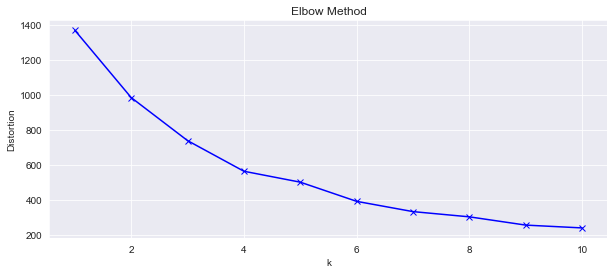

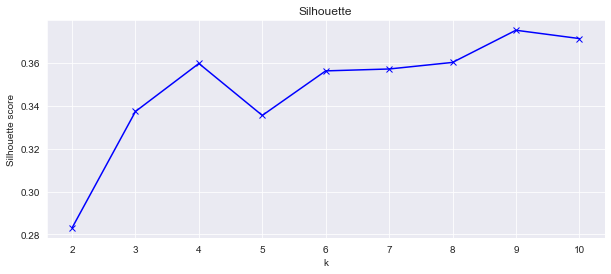

In [29]:
# DTW algorithm을 이용한 알고리즘 수행 (좀 오래걸림)'Euclidean'으로 간소화
get_kmeans_results(df=scaled_ts, max_clusters=10, metric='euclidean', seed=SEED)

In [30]:
# 클러스터링 결과 시각화하기 
# cluster분포 시각화
def plot_clusters(df, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model 

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm 
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...) 
    Returns:
    -------
    None
    """
    # fit_predict함수
    cluster_labels = cluster_model.fit_predict(df)
    centroids = cluster_model.cluster_centers_ # centroids를 갖는다. 이는 군집의 중심점이란 것이다. 이를 수치적으로 출력하기 위해서는 .cluster_centers_ 라는 함수를 통해서 좌표값을 확인할 수 있다. 
    u_labels = np.unique(cluster_labels)
    
    # Centroids 시각화
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")
    
    # 데이터를 2D로 축소하기
    if df.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(df)
        for u_label in u_labels:
            # cluster_label은 종목코드[x]에 포함되는 label
            cluster_points = df[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = df[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels')


### <a> 5-1) TSNE 방법 </a>

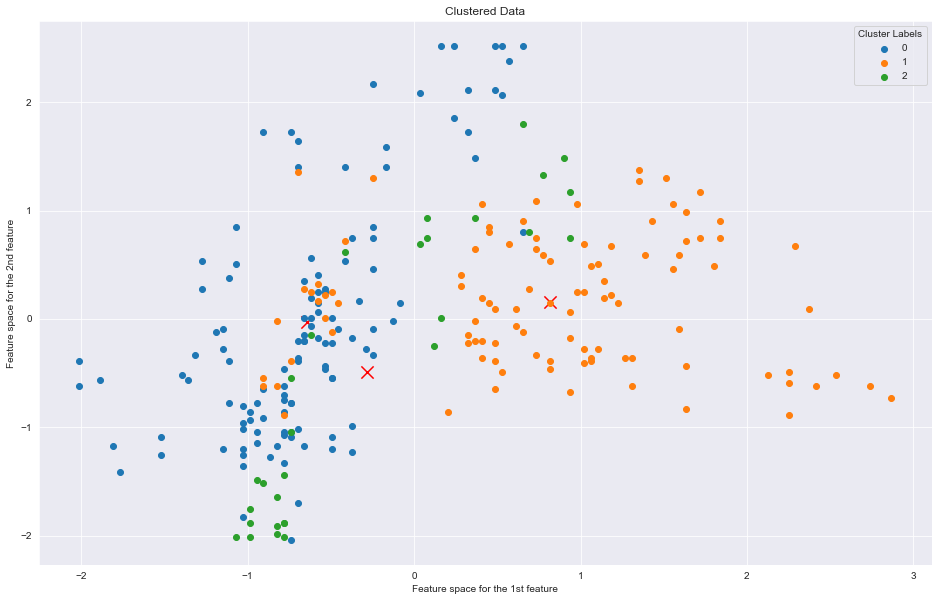

In [39]:
# tsne, 유클리디안 방법의 최적의 클러스터 수를 적용해보자
model = TimeSeriesKMeans(n_clusters=2, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(df=scaled_ts,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

##### DTW metirc이용해서 유사한 시계열을 찾아보자

In [50]:
# # let's look at the cluster shape
# model = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

# plot_clusters(data=final_df,
#               cluster_model=model,
#               dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

### <a> 5-2) MDS 방법 </a>

  0%|          | 0/10 [00:00<?, ?it/s]

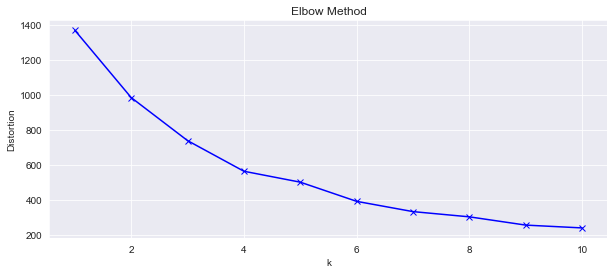

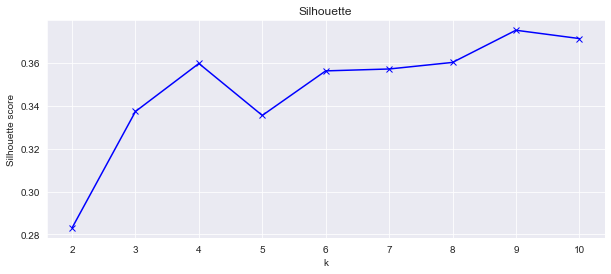

In [41]:
mds = MDS(n_components=2, n_init=3, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(scaled_ts) 

get_kmeans_results(df=scaled_ts, max_clusters=10, metric='euclidean', seed=SEED)

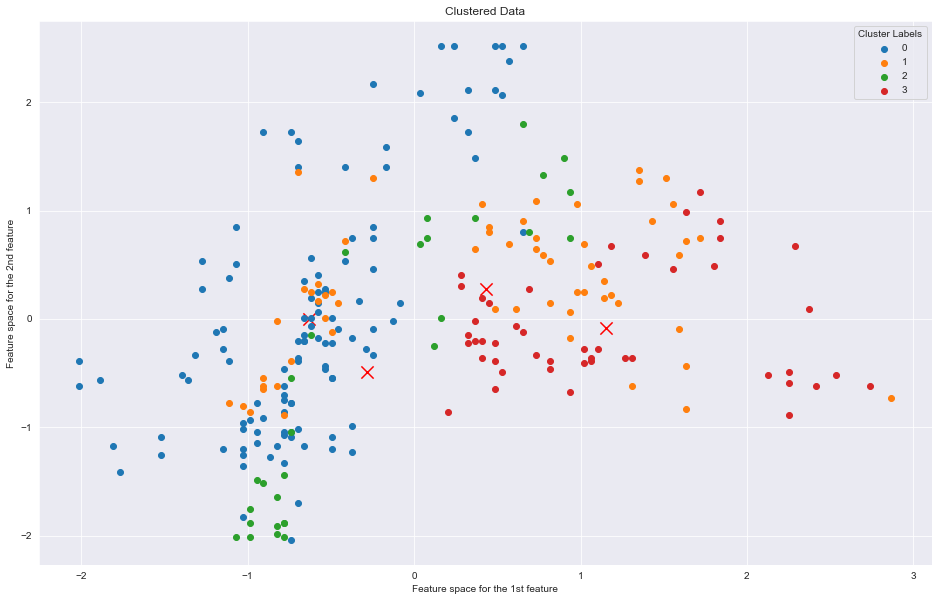

In [46]:
# let's look at the cluster shape
model = TimeSeriesKMeans(n_clusters=4, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(df=scaled_ts,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

클러스터의 개수를 2개 또는 5개로 선택하면 될 것 같다.

### <a>5-3) Hierarchical Agglomerative Clustering(HAC) : 계층적 군집분석 </a> 

In [47]:
# HAC clustering (get_kmeans_results function와 비슷한 구조)
def get_hac_results(df, max_clusters=10, linkage='euclidean', seed=23):
    silhouette = []
    clusters_range = range(2, max_clusters+1)
    for K in tqdm(clusters_range):
        model = AgglomerativeClustering(n_clusters=K, linkage=linkage)
        model.fit(df)
        silhouette.append(silhouette_score(df, model.labels_))
        
    # Plot
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette')
    plt.grid(True);

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

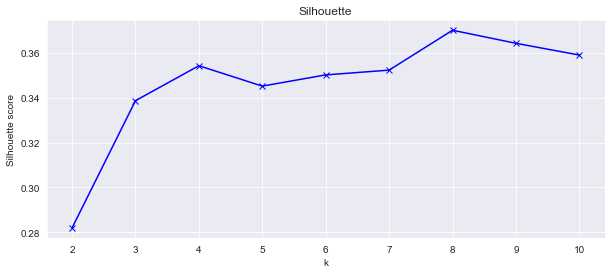

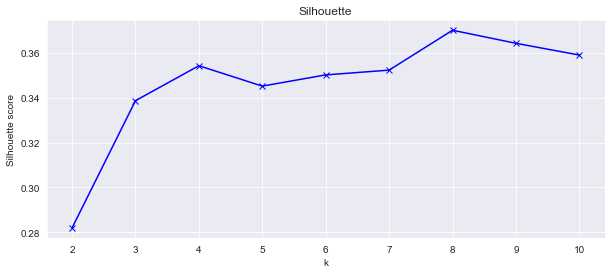

In [53]:
# Look at all results at a time 
#  data_tsne,
features_df = [scaled_ts, data_mds]
for df in features_df:
    get_hac_results(df=scaled_ts, max_clusters=10, linkage='ward', seed=SEED)

In [54]:
def plot_dendrogram(df, model, figsize=(16,10), **kwargs):
    """
    Plots a dendogram using HAC 

    data: pd.DataFrame or np.array
        Time Series Data
    model: Class
        Clustering Model 
    figsize: tuple
        Figure size
    Returns:
    -------
    None 
    """
    model.fit(df)
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    
    plt.figure(figsize=figsize, dpi=200)
    dendrogram(linkage_matrix, **kwargs)
    plt.title('Dendogram')
    plt.xlabel('Objects')
    plt.ylabel('Distance')
    plt.grid(False)
    plt.tight_layout();

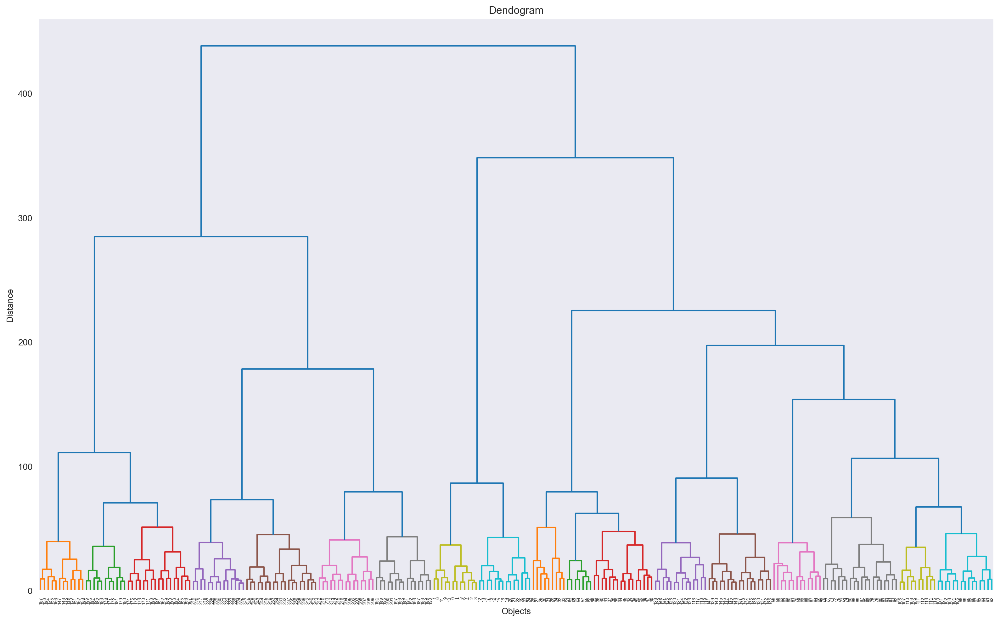

In [58]:
# Dendrogram(덴드로그램) : 클리스터링의 결과를 시각화하기 위한 대표적인 그래프
model = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean', compute_distances=True)

plot_dendrogram(df=scaled_ts,
                model=model,
                color_threshold=60)

###  <a id='4.6'>6. Time Series KMeans의 결과</a> 
마지막으로 MDS와 5개 클러스터를 사용하여 차원이 축소된 TimeSeries KMeans를 선택한다. 나는 두 개의 군집으로는 충분하지 않다고 생각한다. 데이터가 다양할 가능성이 높으며 5개의 클러스터가 있으면 유사한 시리즈로 묶인 클러스터를 얻을 수 있을 것이다.

In [59]:
# Train TimeSeriesKMeans with MDS
kmeans_model = TimeSeriesKMeans(n_clusters=5, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)
cluster_labels = kmeans_model.fit_predict(data_mds)

ts_clustered = [ scaled_ts[(cluster_labels == lable), :] for lable in np.unique(cluster_labels)]

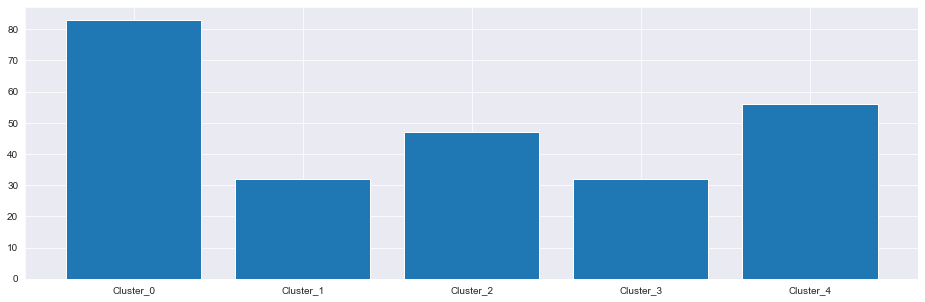

In [60]:
# Objects distribution in the obtained clusters 
labels = [f'Cluster_{i}' for i in range(len(ts_clustered))]
samples_in_cluster = [val.shape[0] for val in ts_clustered]

plt.figure(figsize=(16,5))
plt.bar(labels, samples_in_cluster);

In [61]:
 def plot_cluster_ts(current_cluster):
    """
    Plots time series in a cluster 

    current_cluster: np.array
        Cluster with time series 
    Returns:
    -------
    None 
    """
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0]/4)),4,
        figsize=(45, 3*int(np.ceil(current_cluster.shape[0]/4)))
    )
    fig.autofmt_xdate(rotation=45)
    ax = ax.reshape(-1)
    for indx, series in enumerate(current_cluster):
        ax[indx].plot(series)
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show();

==========Cluster number: 0==========


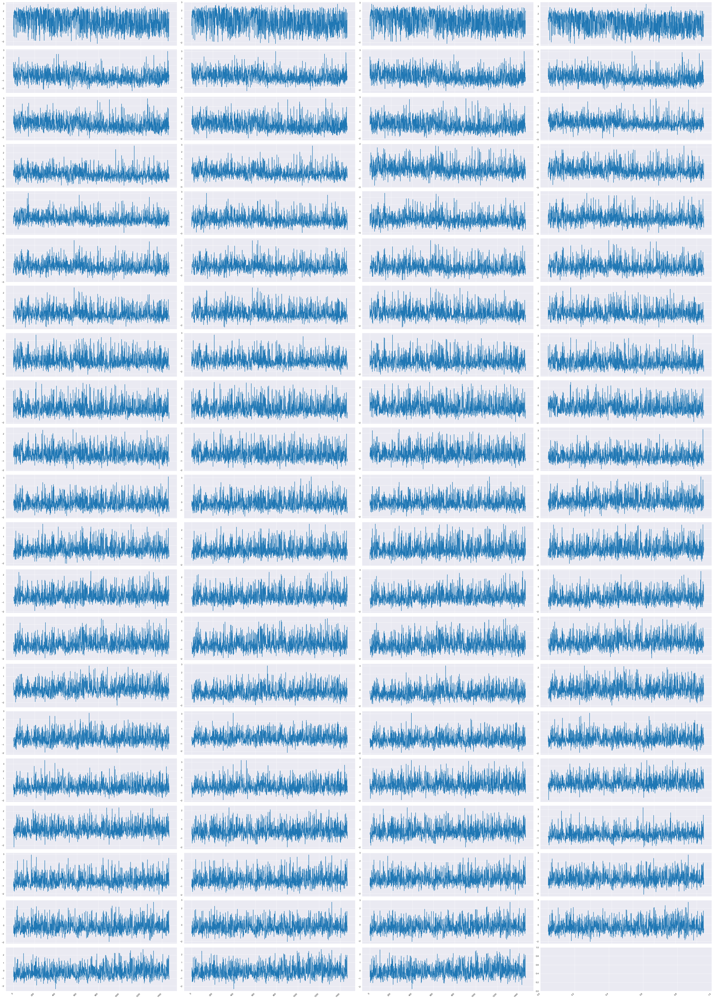

==========Cluster number: 1==========


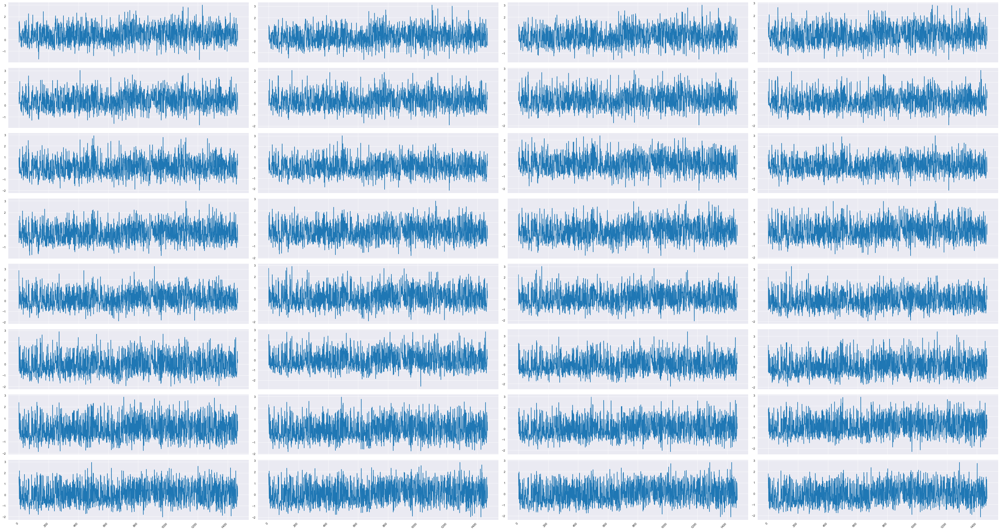

==========Cluster number: 2==========


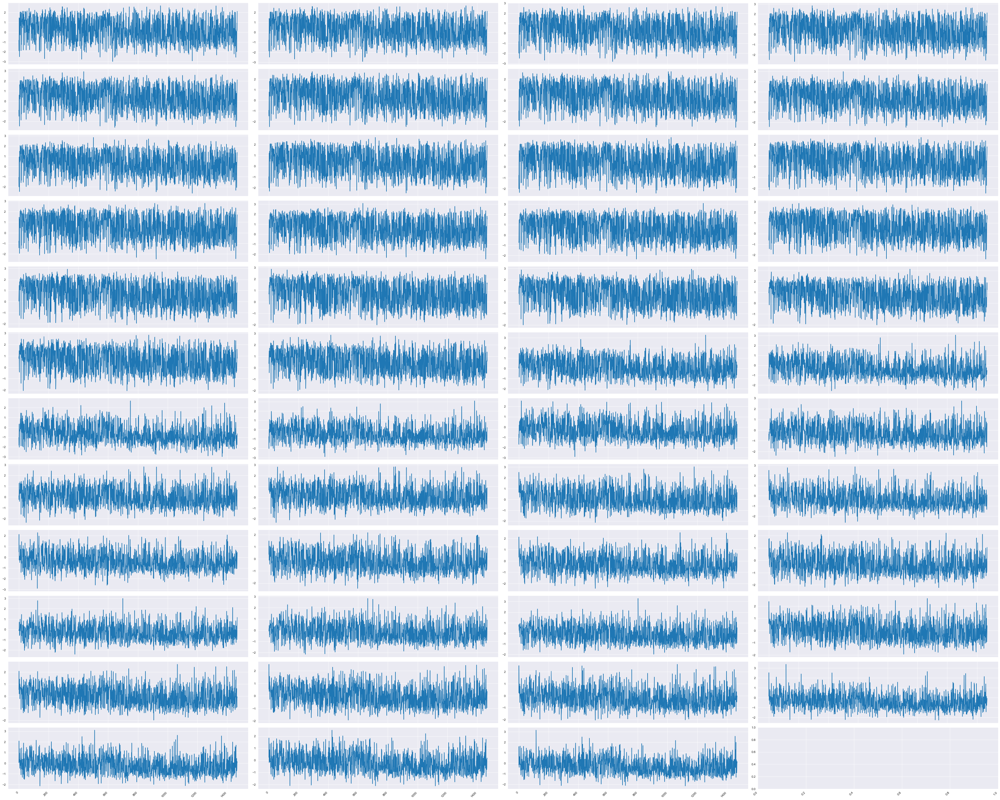

==========Cluster number: 3==========


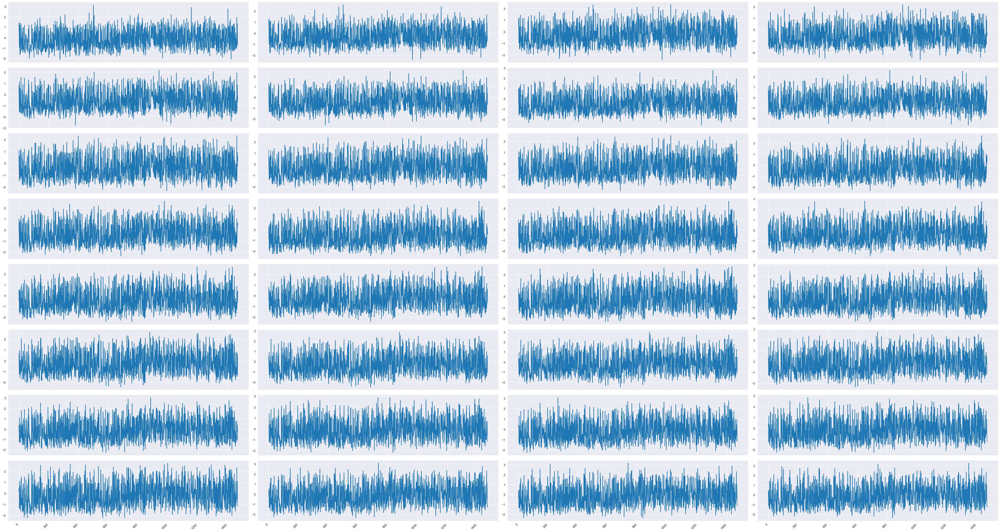

==========Cluster number: 4==========


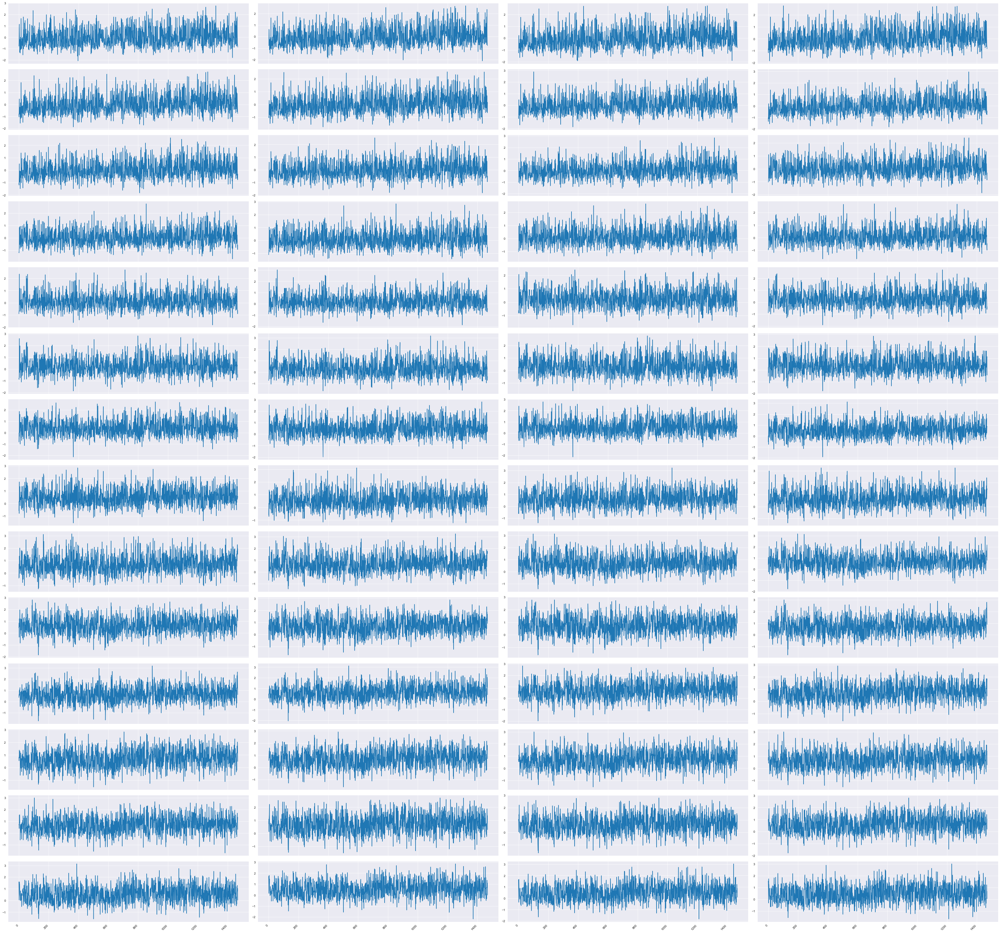

In [62]:
for cluster in range(len(ts_clustered)):
    print(f"==========Cluster number: {cluster}==========")
    plot_cluster_ts(ts_clustered[cluster])

그것의 클러스터 내의 대부분의 시계열은 비슷하다. 우리는 모든 상점을 5개의 다른 그룹으로 묶을 수 있다는 것을 알아냈다. 같은 패턴을 가진 가게들이 있다.

### <a id='5'>5. Cluster Series Extraction</a>
좋다, 우리는 시계열 데이터를 군집화했다. 그 다음에는 어떻게 해야할까? 그건 당신이 다루는 데이터가 무엇이냐에 달렸다. 아마 데이터를 군집화하고난 후에 클러스터된 시계열을 얻고 싶어할 것이다.(클러스터 안의 데이터를 대표하는)

다음과 같은 방법을 쓸 수 있다:
- Use cluster centroid(중앙값)
- Take the mean of all the series in a cluster(평균)
- Takes a series that has a minimum distance to the cluster centroid(최단연결법(?))
- <a href='https://tslearn.readthedocs.io/en/stable/variablelength.html#barycenter-computation'>DBA 방법</a>

We will cover:
- DBA
- Cluster Mean
- Closest Series to Cluster Centroid 

In [63]:
# Closest Series to Cluster Centroid
closest_clusters_indxs = [np.argmin([np.linalg.norm(cluster_center - point, ord=2) for point in data_mds]) \
                                                                        for cluster_center in kmeans_model.cluster_centers_]

closest_ts = scaled_ts[closest_clusters_indxs, :]

In [64]:
# DBA
dba_ts = [dtw_barycenter_averaging(cluster_serieses, max_iter=10, verbose=True) for cluster_serieses in ts_clustered]

Attempt 1
[DBA] epoch 1, cost: 390.719
[DBA] epoch 2, cost: 331.840
[DBA] epoch 3, cost: 319.915
[DBA] epoch 4, cost: 314.222
[DBA] epoch 5, cost: 310.761
[DBA] epoch 6, cost: 308.359
[DBA] epoch 7, cost: 306.606
[DBA] epoch 8, cost: 305.559
[DBA] epoch 9, cost: 304.727
[DBA] epoch 10, cost: 304.122
Attempt 1
[DBA] epoch 1, cost: 198.444
[DBA] epoch 2, cost: 182.601
[DBA] epoch 3, cost: 178.308
[DBA] epoch 4, cost: 176.790
[DBA] epoch 5, cost: 175.812
[DBA] epoch 6, cost: 175.281
[DBA] epoch 7, cost: 174.856
[DBA] epoch 8, cost: 174.635
[DBA] epoch 9, cost: 174.551
[DBA] epoch 10, cost: 174.506
Attempt 1
[DBA] epoch 1, cost: 497.547
[DBA] epoch 2, cost: 440.666
[DBA] epoch 3, cost: 420.312
[DBA] epoch 4, cost: 408.819
[DBA] epoch 5, cost: 401.981
[DBA] epoch 6, cost: 398.082
[DBA] epoch 7, cost: 394.755
[DBA] epoch 8, cost: 392.541
[DBA] epoch 9, cost: 390.799
[DBA] epoch 10, cost: 389.698
Attempt 1
[DBA] epoch 1, cost: 170.397
[DBA] epoch 2, cost: 162.356
[DBA] epoch 3, cost: 160.873
